In [61]:
import numpy as np
import warnings
import matplotlib.pyplot as plt


import librosa
import librosa.display
import soundfile as sf
import speech_recognition as sr
from jiwer import wer, cer

from IPython.display import Audio

import whisper

import csv
import os
import tempfile
import wave

from gtts import gTTS

In [62]:
warnings.filterwarnings('ignore')

In [63]:
audio_signal, sample_rate = librosa.load("speech_01.wav", sr=None)

In [64]:
sample_rate

44100

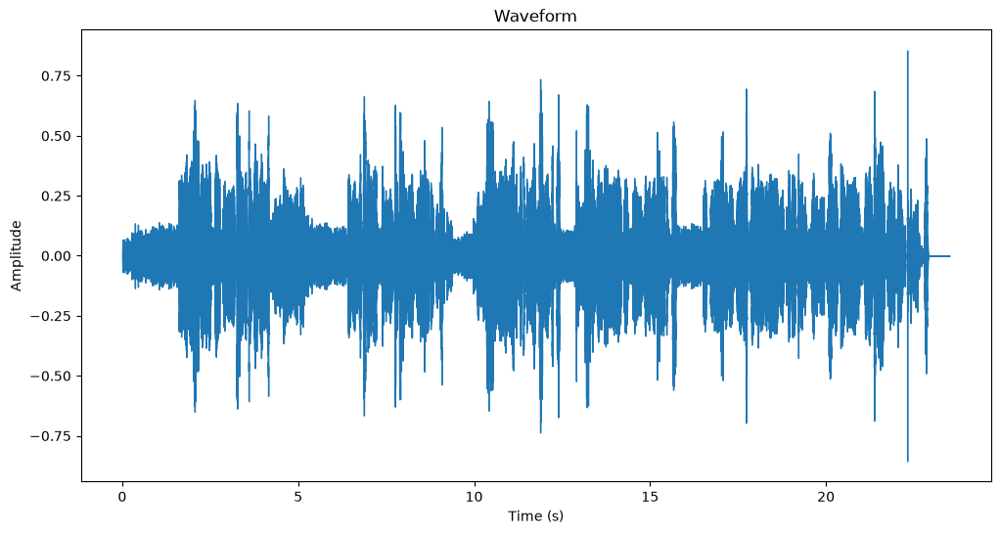

In [65]:
plt.figure(figsize=(12, 6))
librosa.display.waveshow(audio_signal, sr=sample_rate)
plt.title("Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

Audio("speech_01.wav")

In [66]:
recognizer = sr.Recognizer()

In [67]:
file_path = "speech_01.wav"

In [68]:
def transcribe_audio(file_path):
    with sr.AudioFile(file_path) as source:
        audio_data = recognizer.record(source)
        text = recognizer.recognize_google(audio_data)
        print(text)
        return text

transcribed_text = transcribe_audio(file_path)

my name is Yvonne and I am excited to have you as part of our learning community before we get started I'd like to tell you a little bit about myself I'm a sound engineer term data scientist curious about machine learning in artificial intelligence my professional background is primarily in Media Production with a focus on audio it and communications


In [69]:
ground_truth = """My name is Ivan and I am excited to have you as part of our learning community! 
Before we get started, Iíd like to tell you a little bit about myself. I'm a sound engineer turned data scientist,
curious about machine learning and Artificial Intelligence. My professional background is primarily in media production,
with a focus on audio, IT, and communications"""


In [70]:
calculated_cer = cer(ground_truth, transcribed_text)
calculated_wer = wer(ground_truth, transcribed_text)
print(calculated_cer, calculated_wer)

0.0856353591160221 0.3220338983050847


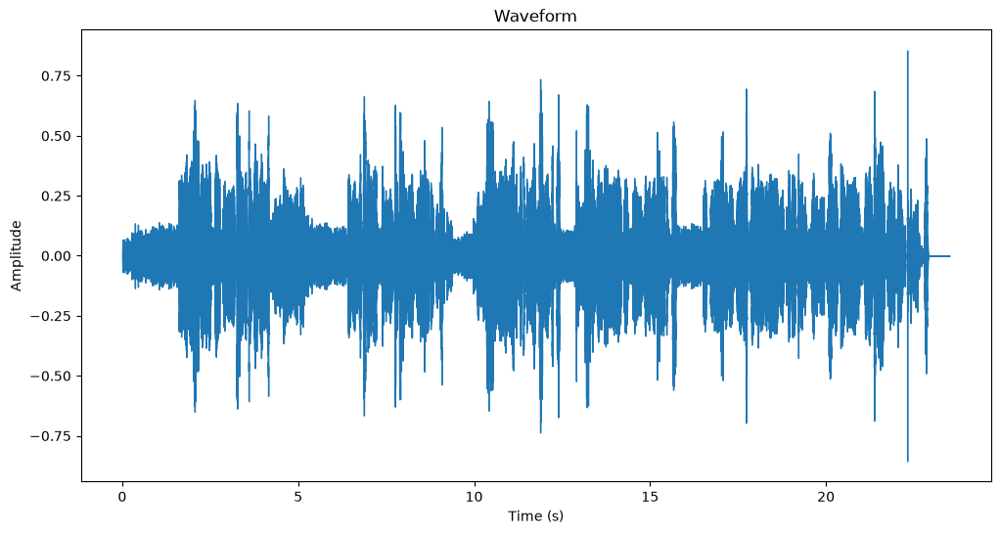

In [71]:
plt.figure(figsize=(12, 6))
librosa.display.waveshow(audio_signal, sr=sample_rate)
plt.title("Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

Audio("speech_01.wav")

In [72]:
S = librosa.stft(audio_signal)

In [73]:
S_db = librosa.amplitude_to_db(abs(S),ref=np.max)

In [74]:
np.max(S_db)

np.float32(0.0)

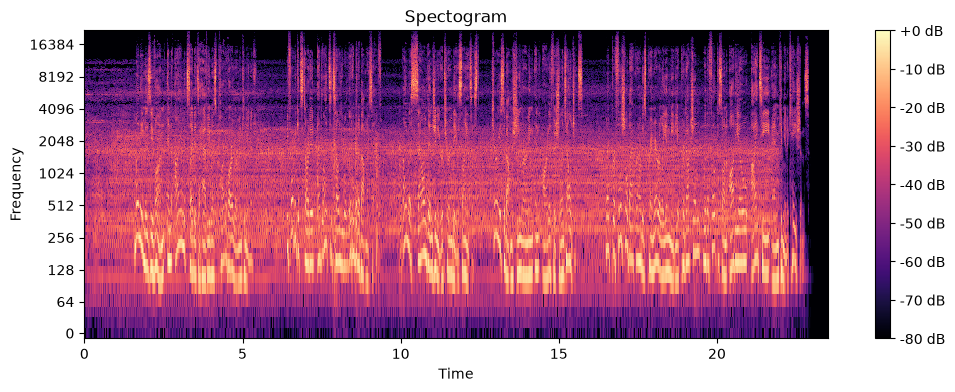

In [75]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(data= S_db, sr=sample_rate, x_axis="time", y_axis="log")
plt.colorbar(format='%+2.0f dB')

plt.title("Spectogram")

plt.xlabel("Time")
plt.ylabel("Frequency")
plt.show()

In [76]:
signal_filtered = librosa.effects.preemphasis(audio_signal, coef=0.97)

sf.write("filtered_speech_01.wav", signal_filtered, sample_rate)
output_file = "filtered_speech_01.wav"

In [77]:
print("Playing original audio: ")
Audio(file_path)

Playing original audio: 


In [78]:
print("Playing filtered audio: ")
Audio(output_file)

Playing filtered audio: 


In [79]:
Sb = librosa.stft(signal_filtered)
S_dBb = librosa.amplitude_to_db(abs(Sb), ref=np.max)

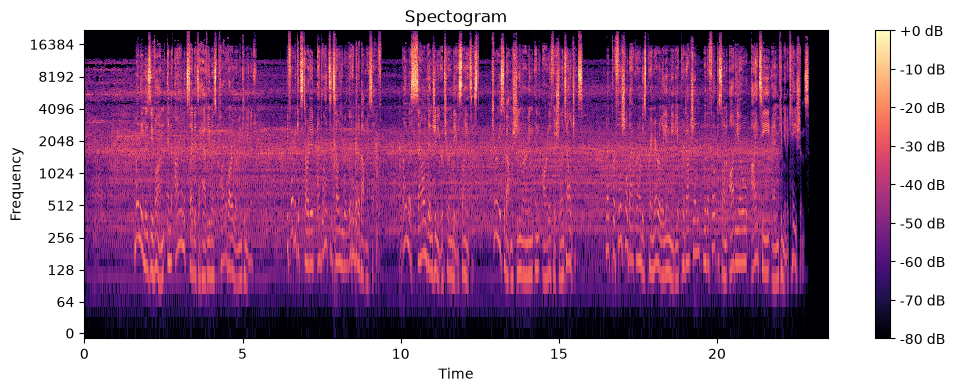

In [80]:
plt.figure(figsize=(12,4))
librosa.display.specshow(data=S_dBb, sr=sample_rate, x_axis="time", y_axis="log")
plt.colorbar(format="%+2.0f dB")
plt.title("Spectogram")
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.show()

In [81]:
transcribed_text_preemphasis = transcribe_audio("filtered_speech_01.wav")

my name is Yvonne and I am excited to have you as part of our learning community before we get started I'd like to tell you a little bit about myself I'm a sound engineer turn data scientist curious about machine learning and artificial intelligence my professional background is primarily in Media Production with a focus on audio it and communications


In [82]:
calculated_cer = cer(ground_truth, transcribed_text_preemphasis)
calculated_wer = wer(ground_truth, transcribed_text_preemphasis)
print(calculated_cer, calculated_wer)

0.07458563535911603 0.3050847457627119


In [83]:
model = whisper.load_model("large")

In [84]:
result = model.transcribe(file_path)

In [85]:
transcribed_text_whisper = result['text']
transcribed_text_whisper

" My name is Ivan, and I am excited to have you as part of our learning community. Before we get started, I'd like to tell you a little bit about myself. I'm a sound engineer turned data scientist, curious about machine learning and artificial intelligence. My professional background is primarily in media production with a focus on audio, IT, and communications."

In [86]:
result['language']

'en'

In [87]:
calculated_cer = cer(ground_truth, transcribed_text_whisper)
calculated_wer = wer(ground_truth, transcribed_text_whisper)
print("Word Error Rate (WER): ", calculated_wer)
print("Character Error Rate (CER): ", calculated_cer)

Word Error Rate (WER):  0.1694915254237288
Character Error Rate (CER):  0.027624309392265192


In [88]:
directory_path = 'Recordings'

In [93]:
def transcribe_directory_whisper(directory_path):
    transcriptions = []
    for file_name in os.listdir(directory_path):
        if file_name.endswith(".wav"):
            file_path = os.path.join(directory_path, file_name)
            results = model.transcribe(file_path)
            transcription = results["text"]
            transcriptions.append({"file_name":file_name, "transcription":transcription})
    return transcriptions


In [94]:
transcriptions = transcribe_directory_whisper(directory_path)

In [95]:
print(transcriptions)

[{'file_name': 'Track8.wav', 'transcription': " From the website cookies you've been asked to accept while surfing the web, to the sonification of a supermassive black hole."}, {'file_name': 'Track2.wav', 'transcription': ' My professional background is primarily in media production with a focus on audio, IT, and communications.'}, {'file_name': 'Track3.wav', 'transcription': " Over the years, I've developed a strong interest in digital signal processing, sound and music computing."}, {'file_name': 'Track1.wav', 'transcription': " I'm a sound engineer turned data scientist, curious about machine learning and artificial intelligence."}, {'file_name': 'Track4.wav', 'transcription': ' As a graduate of sound engineering, I make it a priority to strike a balance between art and technology in my work.'}, {'file_name': 'Track5.wav', 'transcription': ' I believe that nowadays, data is the key to everything.'}, {'file_name': 'Track7.wav', 'transcription': ' but it can also give you efficient me

In [99]:
output_path = "transcriptions.csv"

with open(output_path, mode='w', newline="") as files:
    writer = csv.writer(files)
    writer.writerow(["Track Number", "File Name", "Transcription"])
    for number, row in enumerate(transcriptions, start=1):
        writer.writerow([number, row["file_name"], row["transcription"]])
    

In [100]:
text = """Thank you for taking the time to watch our course on speech recognition!
This concludes the final lesson of this section. See you soon!"""

In [102]:
tts = gTTS(text, lang="en")
tts.save("output.mp3")

Audio("output.mp3")